This dataset was downloaded from [Kaggle](https://www.kaggle.com/datasets/fatihb/coffee-quality-data-cqi).

# About Dataset
## Coffee Quality Institute
The Coffee Quality Institute (CQI) is a non-profit organization that works to improve the quality and value of coffee worldwide. It was founded in 1996 and has its headquarters in California, USA.

CQI's mission is to promote coffee quality through a range of activities that include research, training, and certification programs. The organization works with coffee growers, processors, roasters, and other stakeholders to improve coffee quality standards, promote sustainability, and support the development of the specialty coffee industry.

## Data
CQI maintains a web database that serves as a resource for coffee professionals and enthusiasts who are interested in learning about coffee quality and sustainability. The database includes a range of information on coffee production, processing, and sensory evaluation. It also contains data on coffee genetics, soil types, and other factors that can affect coffee quality.

### Sensory evaluations (coffee quality scores)
- Aroma: Refers to the scent or fragrance of the coffee.
- Flavor: The flavor of coffee is evaluated based on the taste, including any sweetness, bitterness, acidity, and other flavor notes.
- Aftertaste: Refers to the lingering taste that remains in the mouth after swallowing the coffee.
- Acidity: Acidity in coffee refers to the brightness or liveliness of the taste.
- Body: The body of coffee refers to the thickness or viscosity of the coffee in the mouth.
- Balance: Balance refers to how well the different flavor components of the coffee work together.
- Uniformity: Uniformity refers to the consistency of the coffee from cup to cup.
- Clean Cup: A clean cup refers to a coffee that is free of any off-flavors or defects, such as sourness, mustiness, or staleness.
- Sweetness: It can be described as caramel-like, fruity, or floral, and is a desirable quality in coffee.

**PLEASE NOTE**: 'Total Cup Points' is literally the total of 10 features given above. There were some notebooks trying to predict the total cup points given these features. We know the exact function underlying the total cup points.

### Defects
Defects are undesirable qualities that can occur in coffee beans during processing or storage. Defects can be categorized into two categories: Category One and Category Two defects.

- **Category One defects** are primary defects that can be perceived through visual inspection of the coffee beans. These defects include Black beans, sour beans, insect-damaged beans, fungus-damaged beans, etc.

- **Category Two defects** are secondary defects that are more subtle and can only be detected through tasting. These defects include Over-fermentation, staleness, rancidness, chemical taste, etc.

---

Let's start the data profiling.

In [1]:
import pandas as pd
import seaborn as sns

sns.set_theme()

coffee_df = pd.read_csv('./df_arabica_clean.csv', index_col=0)
coffee_df = coffee_df.drop('ID', axis=1) # ID is the same as index
coffee_df.head()

,Country of Origin,Farm Name,Lot Number,Mill,ICO Number,Company,Altitude,Region,Producer,Number of Bags,...,Total Cup Points,Moisture Percentage,Category One Defects,Quakers,Color,Category Two Defects,Expiration,Certification Body,Certification Address,Certification Contact
0,Colombia,Finca El Paraiso,CQU2022015,Finca El Paraiso,NaN,Coffee Quality Union,1700-1930,"Piendamo,Cauca",Diego Samuel Bermudez,1,...,89.33,11.8,0,0,green,3,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
1,Taiwan,Royal Bean Geisha Estate,"The 2022 Pacific Rim Coffee Summit,T037",Royal Bean Geisha Estate,NaN,Taiwan Coffee Laboratory,1200,Chiayi,曾福森,1,...,87.58,10.5,0,0,blue-green,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
2,Laos,OKLAO coffee farms,"The 2022 Pacific Rim Coffee Summit,LA01",oklao coffee processing plant,NaN,Taiwan Coffee Laboratory,1300,Laos Borofen Plateau,WU TAO CHI,19,...,87.42,10.4,0,0,yellowish,2,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
3,Costa Rica,La Cumbre,CQU2022017,La Montana Tarrazu MIll,NaN,Coffee Quality Union,1900,"Los Santos,Tarrazu",Santa Maria de Dota,1,...,87.17,11.8,0,0,green,0,"September 21st, 2023",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901
4,Colombia,Finca Santuario,CQU2023002,Finca Santuario,NaN,Coffee Quality Union,1850-2100,"Popayan,Cauca",Camilo Merizalde,2,...,87.08,11.6,0,2,yellow-green,2,"March 5th, 2024",Japan Coffee Exchange,"〒413-0002 静岡県熱海市伊豆山１１７３−５８ 1173-58 Izusan, Ata...",松澤 宏樹 Koju Matsuzawa - +81(0)9085642901


In [18]:
print('Number of records:', len(coffee_df.index))

Number of records: 207


Total Number of Atributes: 39
Categorical 22 -> ['Country of Origin', 'Farm Name', 'Lot Number', 'Mill', 'ICO Number', 'Company', 'Altitude', 'Region', 'Producer', 'Bag Weight', 'In-Country Partner', 'Harvest Year', 'Grading Date', 'Owner', 'Variety', 'Status', 'Processing Method', 'Color', 'Expiration', 'Certification Body', 'Certification Address', 'Certification Contact']
Numeric: 17 -> ['Number of Bags', 'Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Clean Cup', 'Sweetness', 'Overall', 'Defects', 'Total Cup Points', 'Moisture Percentage', 'Category One Defects', 'Quakers', 'Category Two Defects']


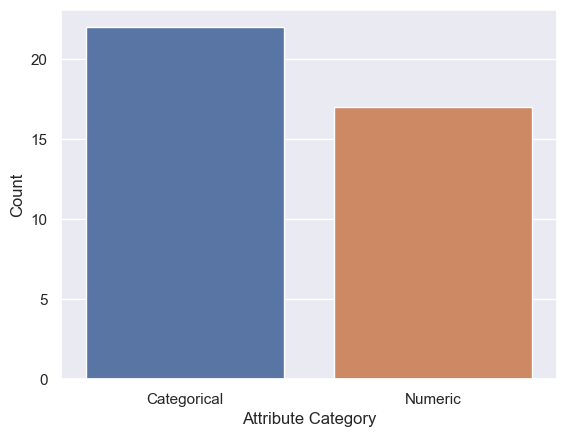

In [24]:
dtypes = coffee_df.dtypes

# Filter categorical and numeric variables
categorical_atts = dtypes[dtypes == 'object'].index.tolist()
numeric_atts = dtypes[~(dtypes == 'object')].index.tolist()

# Plotting the count of variables in each category
categories = ['Categorical', 'Numeric']
counts = [len(categorical_atts), len(numeric_atts)]

ax = sns.barplot(x=categories, y=counts)
_ = ax.set_xlabel('Attribute Category')
_ = ax.set_ylabel('Count')

print('Total Number of Atributes:', sum(counts))
print('Categorical', counts[0], '->', categorical_atts)
print('Numeric:', counts[1], '->', numeric_atts)

39 attributes is already a lot, especially taking into account that we only have 207 records. This means that, if we are to use machine learning models, we are likely to encounter the Hughes phenomenon, also known as the [Curse of Dimensionality](https://en.wikipedia.org/wiki/Curse_of_dimensionality) -- the more attributes we consider in our models, the more records we would need to improve precision. Since we have a fixed number of records, the performance is likely to improve when we start considering more attributes, but it's eventually going to peak and start decreasing.

To deal with this, we are likely going to have to choose the attributes we find best suited for our purposes, during the preprocessing phase.

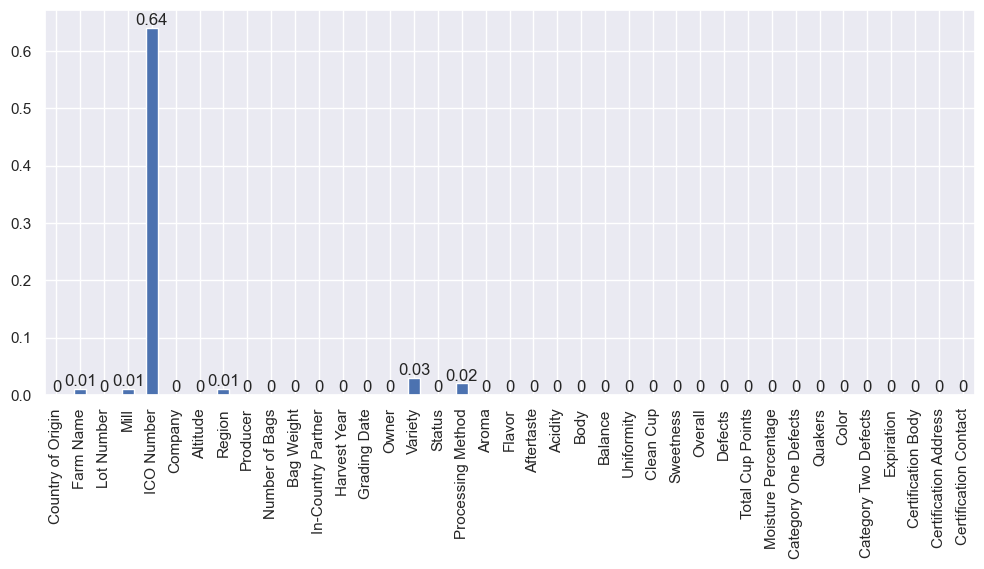

In [25]:
ax = (round(coffee_df.isna().sum() / len(coffee_df), 2)).plot(kind='bar', figsize=(12, 5))
_ = ax.bar_label(ax.containers[0])

As we can see, the 'ICO number' attribute has a large amount of missing values. ~64% of missing values makes the attribute somewhat useless. However, the 'ICO number' is just a number the International Coffee Organization (ICO) attributes to each parcel of coffee; it is, therefore, not of much value.

Some other variables also have missing values, but these are at most 3% of the records. We shall decide what we do with them later.

# Numeric Attributes

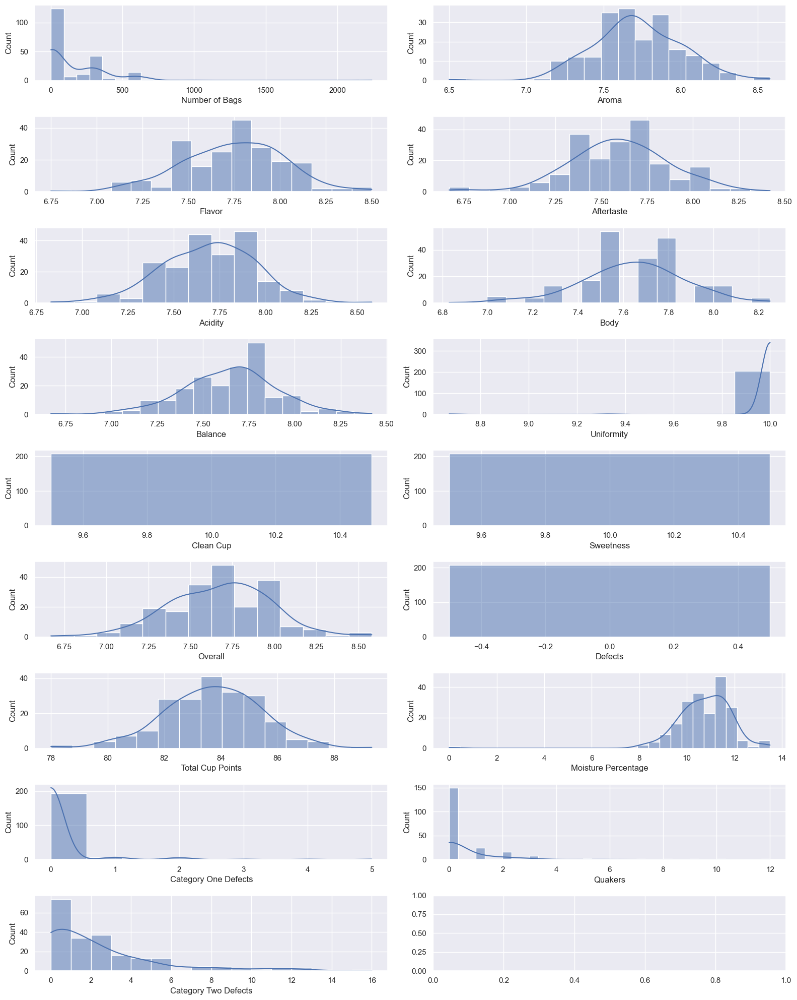

In [42]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows=9, ncols=2, figsize=(16, 20))
ax = ax.flatten()

for i in range(len(ax) - 1):
    sns.histplot(data=coffee_df[numeric_atts[i]], ax=ax[i], kde=True)

plt.tight_layout()

In [88]:
coffee_df.describe()

,Number of Bags,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Clean Cup,Sweetness,Overall,Defects,Total Cup Points,Moisture Percentage,Category One Defects,Quakers,Category Two Defects
count,207.000000,207.000000,207.000000,207.000000,207.00000,207.000000,207.000000,207.000000,207.0,207.0,207.000000,207.0,207.000000,207.000000,207.000000,207.000000,207.000000
mean,155.449275,7.721063,7.744734,7.599758,7.69029,7.640918,7.644058,9.990338,10.0,10.0,7.676812,0.0,83.706570,10.735266,0.135266,0.690821,2.251208
std,244.484868,0.287626,0.279613,0.275911,0.25951,0.233499,0.256299,0.103306,0.0,0.0,0.306359,0.0,1.730417,1.247468,0.592070,1.686918,2.950183
min,1.000000,6.500000,6.750000,6.670000,6.83000,6.830000,6.670000,8.670000,10.0,10.0,6.670000,0.0,78.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,7.580000,7.580000,7.420000,7.50000,7.500000,7.500000,10.000000,10.0,10.0,7.500000,0.0,82.580000,10.100000,0.000000,0.000000,0.000000
50%,14.000000,7.670000,7.750000,7.580000,7.67000,7.670000,7.670000,10.000000,10.0,10.0,7.670000,0.0,83.750000,10.800000,0.000000,0.000000,1.000000
75%,275.000000,7.920000,7.920000,7.750000,7.87500,7.750000,7.790000,10.000000,10.0,10.0,7.920000,0.0,84.830000,11.500000,0.000000,1.000000,3.000000
max,2240.000000,8.580000,8.500000,8.420000,8.58000,8.250000,8.420000,10.000000,10.0,10.0,8.580000,0.0,89.330000,13.500000,5.000000,12.000000,16.000000


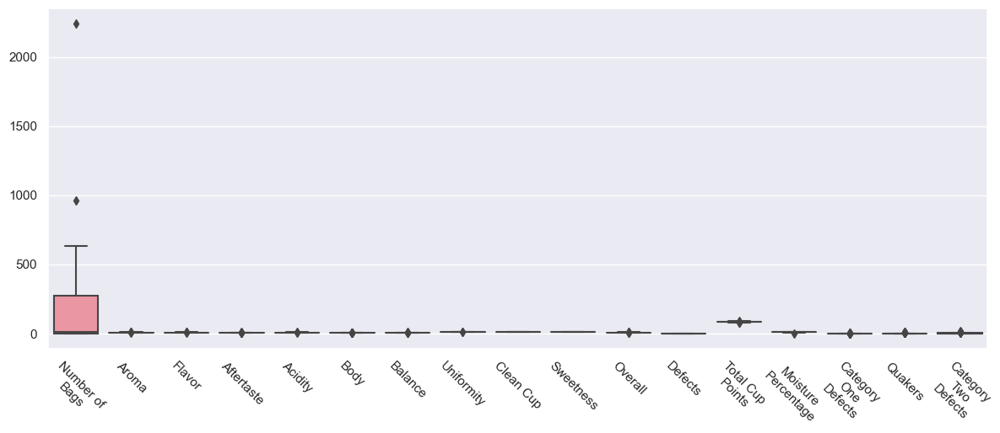

In [65]:
import textwrap

def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

plt.figure(figsize=(12, 5))
ax = sns.boxplot(data=coffee_df[numeric_atts])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

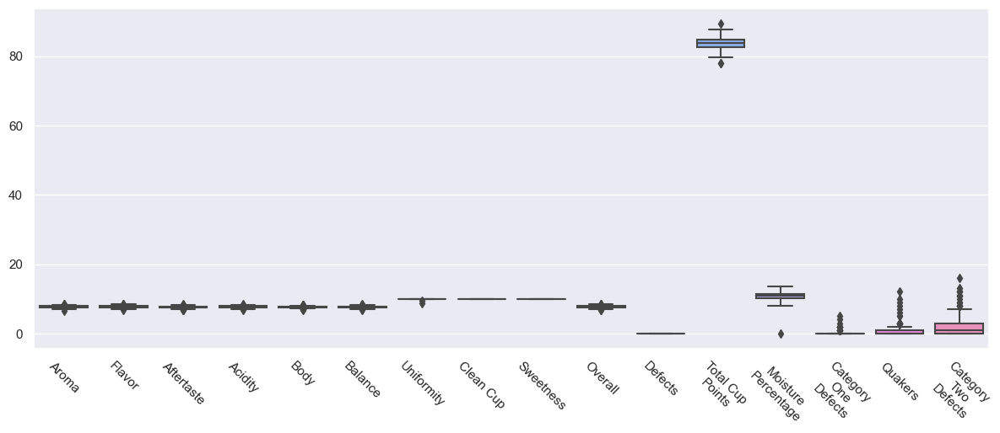

In [74]:
import numpy as np

plt.figure(figsize=(12, 5))
numeric_atts = np.array(numeric_atts)
ax = sns.boxplot(data=coffee_df[numeric_atts[numeric_atts != 'Number of Bags']])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

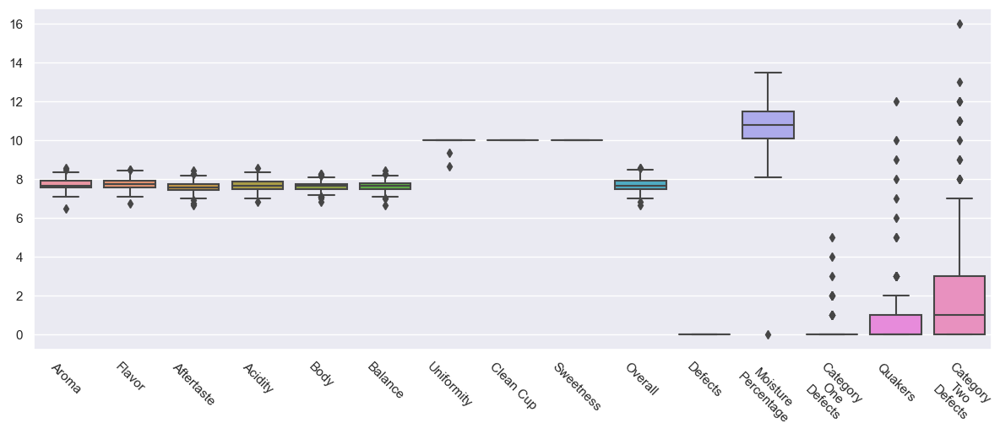

In [75]:
import numpy as np

plt.figure(figsize=(12, 5))
numeric_atts = np.array(numeric_atts)
ax = sns.boxplot(data=coffee_df[numeric_atts[(numeric_atts != 'Number of Bags') & (numeric_atts != 'Total Cup Points')]])
wrap_labels(ax, 10, True)
plt.tight_layout()
ax.tick_params('x', labelrotation=-45)

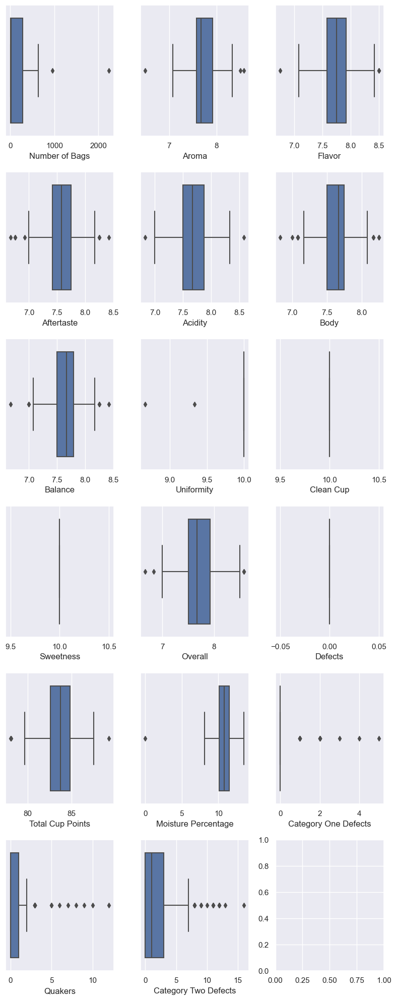

In [87]:
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(8, 20))
ax = ax.flatten()

for i in range(len(ax) - 1):
    sns.boxplot(data=coffee_df, x=numeric_atts[i], ax=ax[i])

plt.tight_layout()

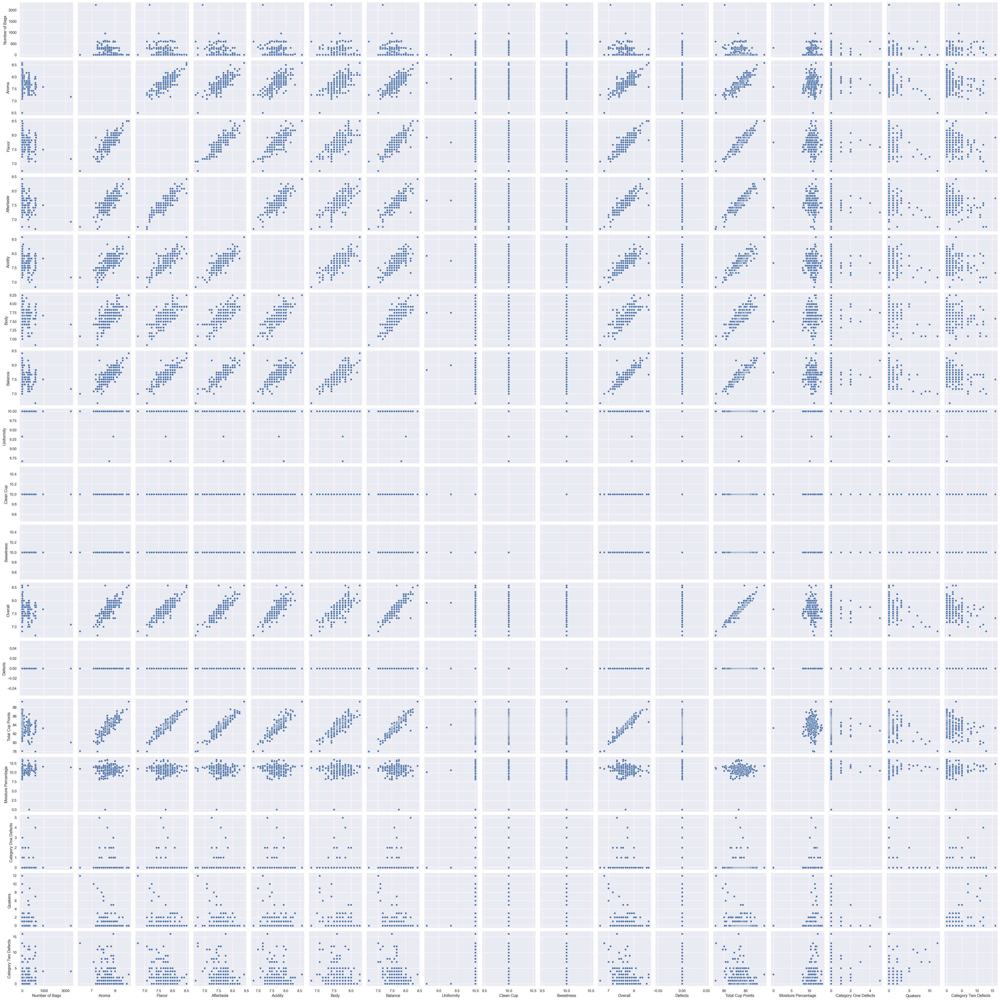

In [2]:
_ = sns.pairplot(data=coffee_df, diag_kind='scatter')

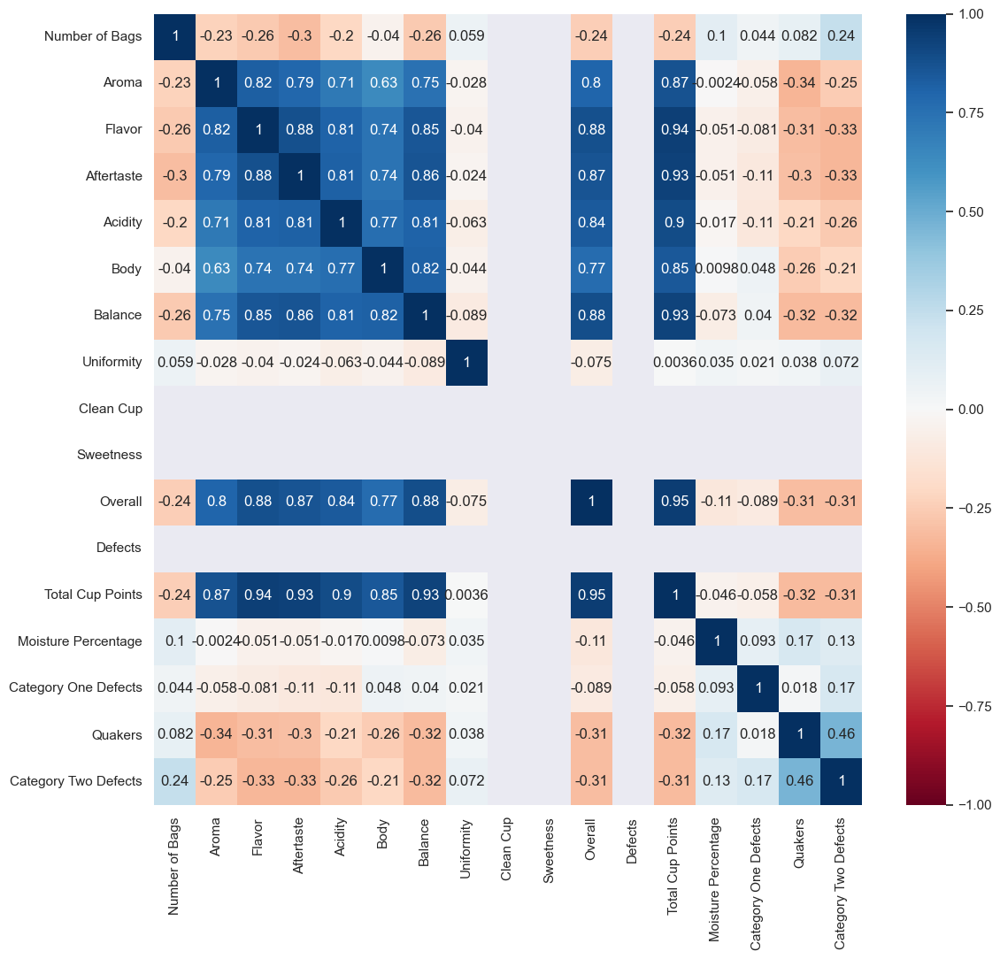

In [10]:
fig = plt.figure(figsize=(12, 11))

sns.heatmap(data=coffee_df.corr(numeric_only=True), vmin=-1, vmax=1, cmap='RdBu', annot=True)
plt.tight_layout()

# Categorical Attributes

# Automatic Profiling

In [11]:
from ydata_profiling import ProfileReport

ProfileReport(coffee_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]